<a href="https://colab.research.google.com/github/Rbrt9/Innova_SS/blob/main/Copia_de_DatasetPECVC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow.keras
from google.colab import files
files.upload()


Saving heka-competition-maladies-cardio-vasculaires.zip to heka-competition-maladies-cardio-vasculaires.zip


{'heka-competition-maladies-cardio-vasculaires.zip': b'PK\x03\x04-\x00\x00\x00\x08\x00\xbb\x88{U\x89]\xe9\xe7\xff\xff\xff\xff\xff\xff\xff\xff\x15\x00\x14\x00sample_submission.csv\x01\x00\x10\x00\x9f\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x00\x00\x00\x00\x0bH,\xc9L\xcd+\x89\xf7t\xd1\xf1HM,*q\xc9,NM,N\xe5\x82\x89GDD\x18\xea\x18 s\x8dP\xb9\xc6\xa8\\\x13T\xae)*\xd7L\xc7\x10\x99k\x8e*k\x81\xca\xb5\x04r\x01PK\x03\x04-\x00\x00\x00\x08\x00\xbb\x88{UJ\xfaYy\xff\xff\xff\xff\xff\xff\xff\xff\x08\x00\x14\x00test.csv\x01\x00\x10\x00U\xa8\x86\x00\x00\x00\x00\x00\x9c\x8b\x15\x00\x00\x00\x00\x00\xac\xbd[\xafeG\x8e\x1e\xf8>\xbfB\xf0\x93\r\x1c\x9d\t\xc6=\x1ee\xb7\x9dn\x0c\xce\x9e\xc6\xb4a#\x9f\x0cY\x95\xaeJ\xb4J\xd9\x90d\xc3\xf5\xef\'\xc8Xk\xaf\xb8\x91\x11{\x95\xd0\x12T\x9dy\x0ewl\x06\x83w~\xfc\xa7\x1f\x7f\xff\xfa\xe5\x97\xdf\xff\xfb?\xfe\xc3\xdb\xbf\xff\xf8\xc7\xb7\x7f\xfe\xeb\xb7\x7f\xf9\xfa\xcb\x9f\xdf~\xf8\xf9\xa7o\x7f\xf9\xf6\xf3?\xfc\xfa\xf5\x17\xfa\xff\xff\xf9\xf7_\xbf\xfd\xcb\x97\xb7\x7f\xfa\xc

In [ ]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

mv: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [ ]:
!pip install kaggle

In [ ]:
# Descargar el dataset de la competencia
!kaggle competitions download -c heka-competition-maladies-cardio-vasculaires

# Descomprimir el archivo descargado
!unzip heka-competition-maladies-cardio-vasculaires.zip

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.10/dist-packages/kaggle/__init__.py", line 7, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.10/dist-packages/kaggle/api/kaggle_api_extended.py", line 398, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.
Archive:  heka-competition-maladies-cardio-vasculaires.zip
  inflating: sample_submission.csv   
  inflating: test.csv                
  inflating: train.csv               


In [ ]:
import pandas as pd

data = pd.read_csv("train.csv")
data.head()

,Patient_ID,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease
0,Patient_118020,45.61,Yes,No,No,0.0,0.0,No,Male,35-39,White,No,Yes,Good,360 min,No,No,No,No
1,Patient_196414,37.59,Yes,No,No,7.0,20.0,No,Female,30-34,Hispanic,No,Yes,Very good,480 min,No,No,No,No
2,Patient_107743,19.37,Yes,No,No,0.0,0.0,No,Female,50-54,White,No,Yes,Good,2 hrs,No,No,No,No
3,Patient_28303,48.42,No,No,No,30.0,15.0,No,Female,30-34,White,No,Yes,Fair,8 hrs,No,No,No,No
4,Patient_118489,27.12,No,No,No,0.0,5.0,No,Male,65-69,White,No,Yes,Very good,360 min,Yes,No,No,No


In [ ]:
data.tail()

,Patient_ID,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease
223851,Patient_153509,36.50,Yes,No,No,0.0,0.0,Yes,Male,70-74,White,Yes,Yes,Good,8 hrs,No,No,No,Yes
223852,Patient_48901,30.81,No,No,Yes,0.0,0.0,No,Male,45-49,Black,Yes,Yes,Good,480 min,Yes,Yes,No,No
223853,Patient_305860,25.12,Yes,No,No,0.0,0.0,Yes,Male,70-74,Black,No,Yes,Good,6 hrs,No,No,No,No
223854,Patient_252244,31.47,No,No,No,0.0,0.0,No,Female,60-64,White,No,Yes,Good,9 hrs,No,No,No,No
223855,Patient_101633,32.45,No,No,No,14.0,0.0,No,Female,50-54,White,No,Yes,Good,360 min,No,No,No,No


In [ ]:
data.columns

Index(['Patient_ID', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory',
       'Race', 'Diabetic', 'PhysicalActivity', 'GenHealth', 'SleepTime',
       'Asthma', 'KidneyDisease', 'SkinCancer', 'HeartDisease'],
      dtype='object')

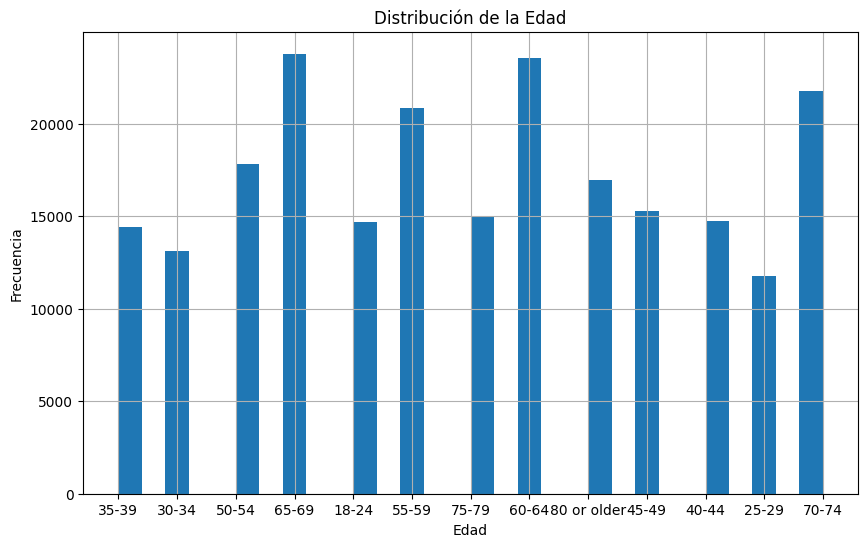

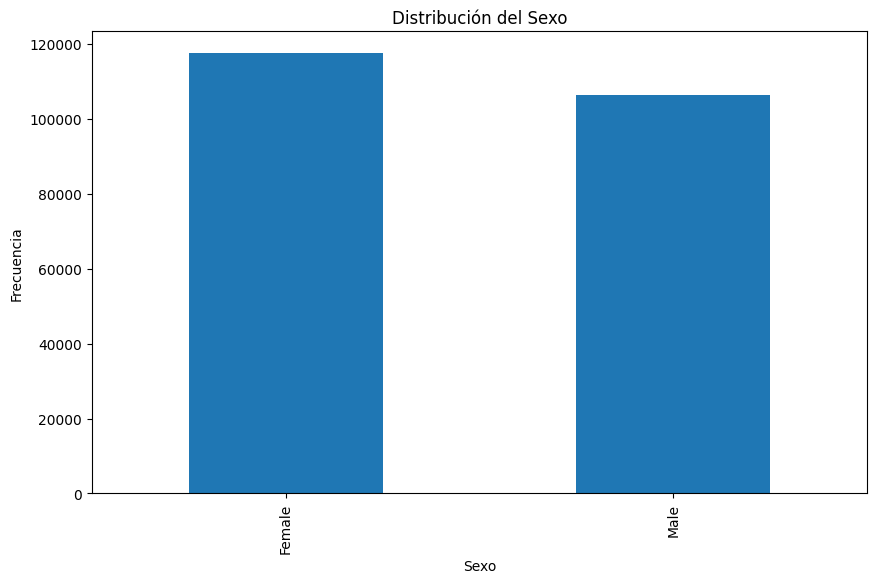

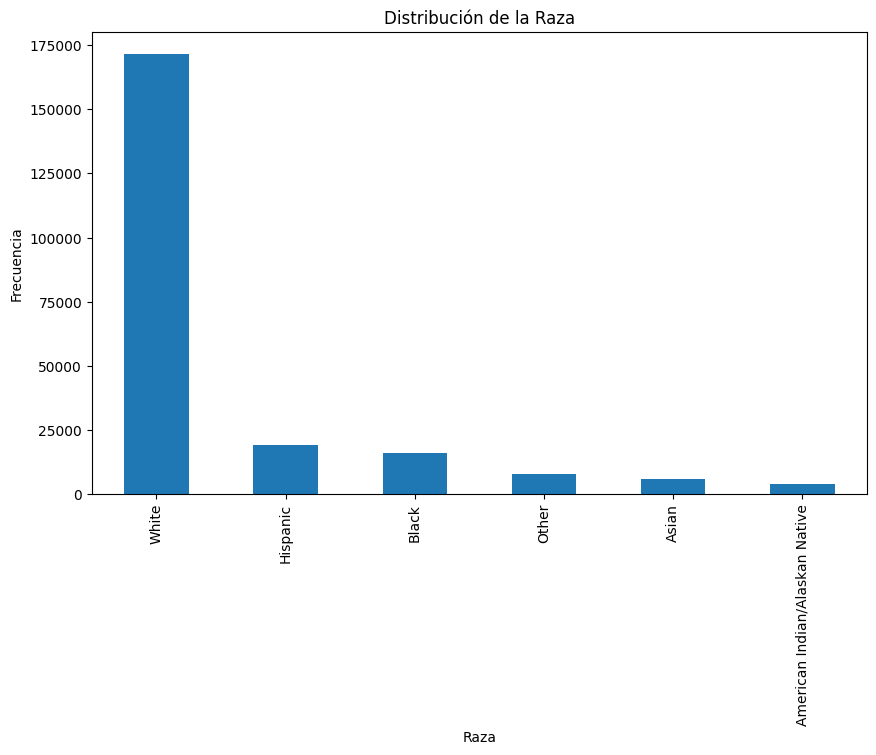

Edad más común: 65-69
Sexo más común: Female
Raza más común: White


In [ ]:
# Paso 3: Análisis Demográfico

# Distribución de la edad
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
data['AgeCategory'].hist(bins=30)
plt.title('Distribución de la Edad')
plt.xlabel('Edad')
plt.ylabel('Frecuencia')
plt.show()

# Distribución del sexo
plt.figure(figsize=(10, 6))
data['Sex'].value_counts().plot(kind='bar')
plt.title('Distribución del Sexo')
plt.xlabel('Sexo')
plt.ylabel('Frecuencia')
plt.show()

# Distribución de la raza
plt.figure(figsize=(10, 6))
data['Race'].value_counts().plot(kind='bar')
plt.title('Distribución de la Raza')
plt.xlabel('Raza')
plt.ylabel('Frecuencia')
plt.show()

# Características demográficas más comunes
common_age = data['AgeCategory'].mode()[0]
common_sex = data['Sex'].mode()[0]
common_race = data['Race'].mode()[0]

print(f'Edad más común: {common_age}')
print(f'Sexo más común: {common_sex}')
print(f'Raza más común: {common_race}')


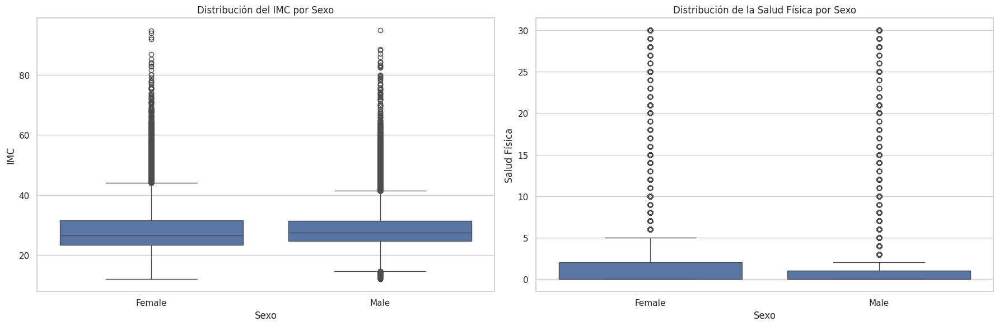

In [ ]:
# Paso 1: Exploración de diferencias potenciales en resultados de salud y comportamientos entre hombres y mujeres
import seaborn as sns

# Configuración general para mejorar la apariencia
sns.set(style="whitegrid")

# Crear una figura y una cuadrícula de subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 6))  # 3 filas y 2 columnas de subplots

# Distribución del IMC por sexo
sns.boxplot(x='Sex', y='BMI', data=data, order=data['Sex'].value_counts().index, ax=axes[0])
axes[0].set_title('Distribución del IMC por Sexo')
axes[0].set_xlabel('Sexo')
axes[0].set_ylabel('IMC')

# Distribución de la salud física por sexo
sns.boxplot(x='Sex', y='PhysicalHealth', data=data, order=data['Sex'].value_counts().index, ax=axes[1])
axes[1].set_title('Distribución de la Salud Física por Sexo')
axes[1].set_xlabel('Sexo')
axes[1].set_ylabel('Salud Física')

# Ajustar los espacios entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()


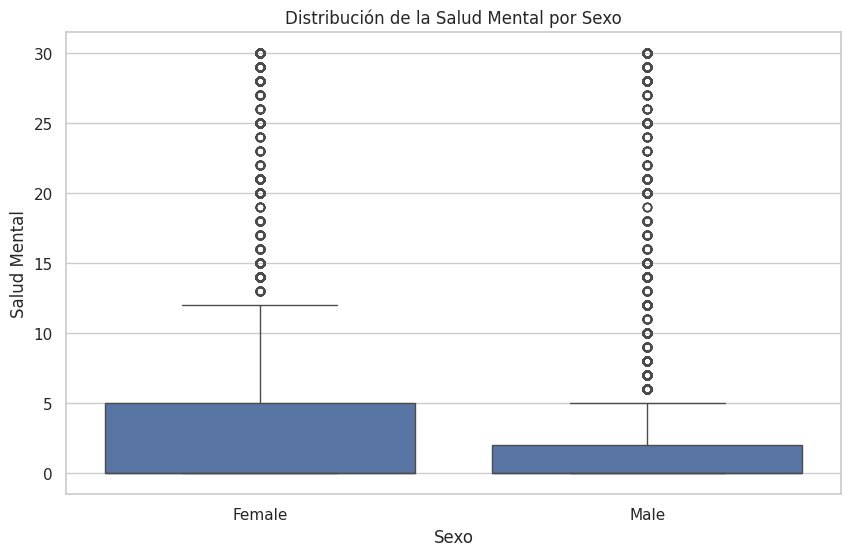

In [ ]:
# Distribución de la salud mental por sexo
plt.figure(figsize=(10, 6))
sns.boxplot(x='Sex', y='MentalHealth', data=data, order=data['Sex'].value_counts().index)
plt.title('Distribución de la Salud Mental por Sexo')
plt.xlabel('Sexo')
plt.ylabel('Salud Mental')
plt.show()

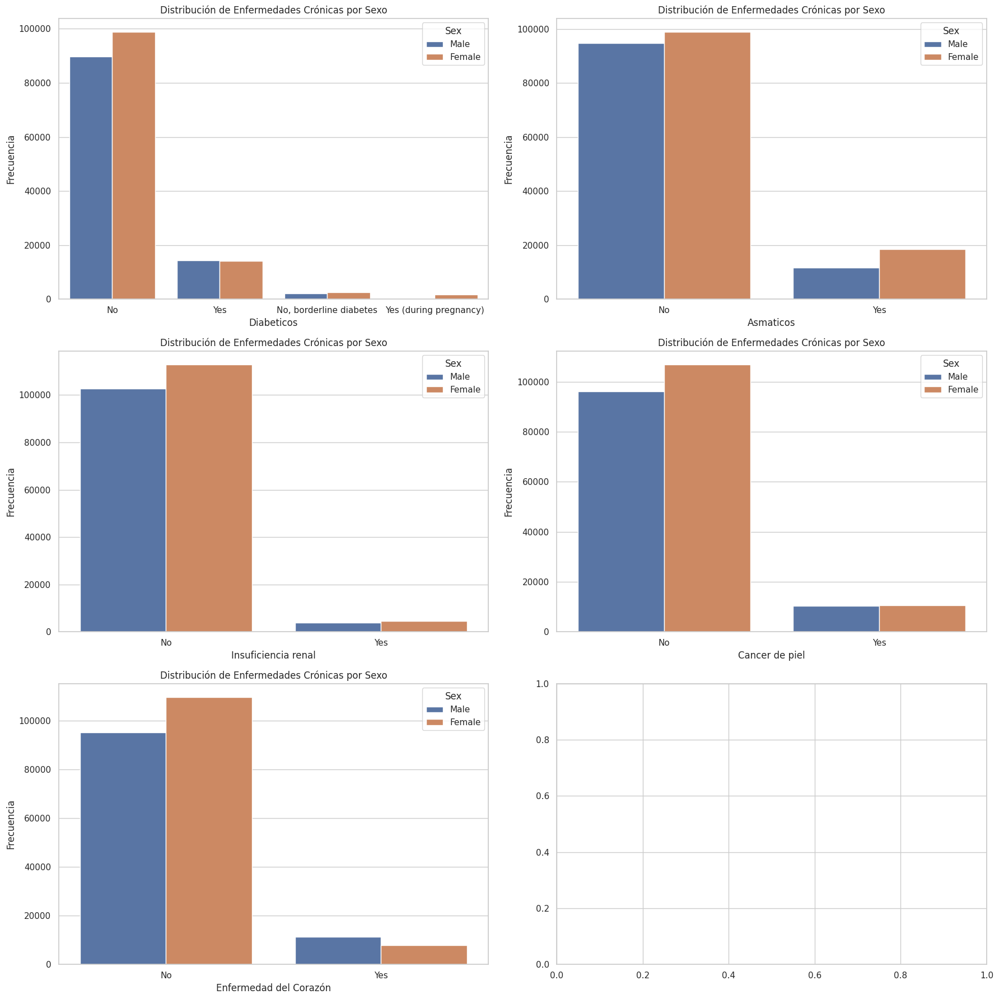

In [ ]:
# Crear una figura y una cuadrícula de subplots
fig, axes = plt.subplots(3, 2, figsize=(18, 18))  # 3 filas y 2 columnas de subplots

# Distribución de enfermedades crónicas por sexo (ordenada)
sns.countplot(x='Diabetic', hue='Sex', data=data, order=data['Diabetic'].value_counts().index, ax=axes[0, 0])
axes[0, 0].set_title('Distribución de Enfermedades Crónicas por Sexo')
axes[0, 0].set_xlabel('Diabeticos')
axes[0, 0].set_ylabel('Frecuencia')

sns.countplot(x='Asthma', hue='Sex', data=data, order=data['Asthma'].value_counts().index, ax=axes[0, 1])
axes[0, 1].set_title('Distribución de Enfermedades Crónicas por Sexo')
axes[0, 1].set_xlabel('Asmaticos')
axes[0, 1].set_ylabel('Frecuencia')

sns.countplot(x='KidneyDisease', hue='Sex', data=data, order=data['KidneyDisease'].value_counts().index, ax=axes[1, 0])
axes[1, 0].set_title('Distribución de Enfermedades Crónicas por Sexo')
axes[1, 0].set_xlabel('Insuficiencia renal')
axes[1, 0].set_ylabel('Frecuencia')

sns.countplot(x='SkinCancer', hue='Sex', data=data, order=data['SkinCancer'].value_counts().index, ax=axes[1, 1])
axes[1, 1].set_title('Distribución de Enfermedades Crónicas por Sexo')
axes[1, 1].set_xlabel('Cancer de piel')
axes[1, 1].set_ylabel('Frecuencia')

sns.countplot(x='HeartDisease', hue='Sex', data=data, order=data['HeartDisease'].value_counts().index, ax=axes[2, 0])
axes[2, 0].set_title('Distribución de Enfermedades Crónicas por Sexo')
axes[2, 0].set_xlabel('Enfermedad del Corazón')
axes[2, 0].set_ylabel('Frecuencia')

# Ajustar los espacios entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

In [ ]:
# Mostrar los valores originales
print("Valores originales de SleepTime:")
print(data['SleepTime'])

# Función para convertir sleep_time de min a hrs y eliminar la parte de 'hrs'
def convert_and_strip_sleep_time(value):
    if 'min' in value:
        # Extraer el número de minutos y convertir a horas
        mins = int(value.split()[0])
        hours = mins / 60
        return hours
    elif 'hrs' in value:
        # Extraer el número de horas y convertir a float
        hours = float(value.split()[0])
        return hours
    else:
        return float(value)
# Aplicar la función a la columna sleep_time
data['SleepTime'] = data['SleepTime'].apply(convert_and_strip_sleep_time)

# Mostrar los valores convertidos
print("Valores convertidos de SleepTime:")
print(data['SleepTime'])

Valores originales de SleepTime:
0         360 min
1         480 min
2           2 hrs
3           8 hrs
4         360 min
           ...   
223851      8 hrs
223852    480 min
223853      6 hrs
223854      9 hrs
223855    360 min
Name: SleepTime, Length: 223856, dtype: object
Valores convertidos de SleepTime:
0         6.0
1         8.0
2         2.0
3         8.0
4         6.0
         ... 
223851    8.0
223852    8.0
223853    6.0
223854    9.0
223855    6.0
Name: SleepTime, Length: 223856, dtype: float64


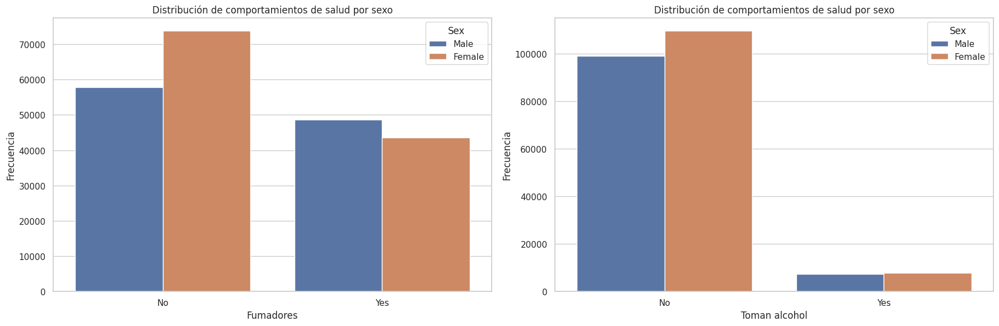

In [ ]:
# Crear una figura y una cuadrícula de subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 6))  # 2 filas y 2 columnas de subplots

# Distribución de comportamientos de salud por sexo
sns.countplot(x='Smoking', hue='Sex', data=data, order=data['Smoking'].value_counts().index, ax=axes[0])
axes[0].set_title('Distribución de comportamientos de salud por sexo')
axes[0].set_xlabel('Fumadores')
axes[0].set_ylabel('Frecuencia')

sns.countplot(x='AlcoholDrinking', hue='Sex', data=data, order=data['AlcoholDrinking'].value_counts().index, ax=axes[1])
axes[1].set_title('Distribución de comportamientos de salud por sexo')
axes[1].set_xlabel('Toman alcohol')
axes[1].set_ylabel('Frecuencia')

# Ajustar los espacios entre los subplots
plt.tight_layout()

# Mostrar la figura
plt.show()

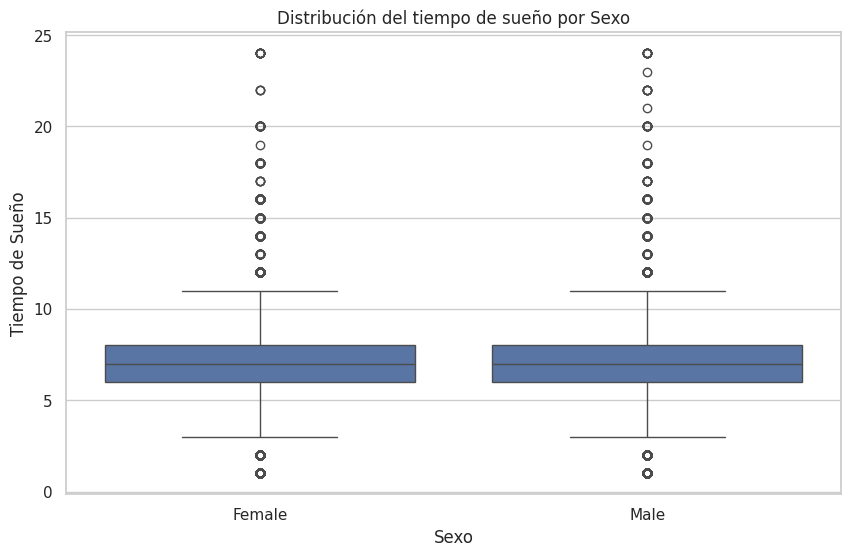

In [ ]:
# Distribución de comportamientos de salud por sexo
plt.figure(figsize=(10, 6))
sns.boxplot(x='Sex', y='SleepTime', data=data, order=data['Sex'].value_counts().index)
plt.title('Distribución del tiempo de sueño por Sexo')
plt.xlabel('Sexo')
plt.ylabel('Tiempo de Sueño')
plt.show()

In [24]:
# Cargar el dataset
data = pd.read_csv('train.csv')

# Codificar las columnas:
data['Sex'] = data['Sex'].map({'Male': 1, 'Female': 0})
data['Smoking'] = data['Smoking'].map({'Yes': 1, 'No': 0})
data['AlcoholDrinking'] = data['AlcoholDrinking'].map({'Yes': 1, 'No': 0})
data['Stroke'] = data['Stroke'].map({'Yes': 1, 'No': 0})
data['DiffWalking'] = data['DiffWalking'].map({'Yes': 1, 'No': 0})
data['Diabetic'] = data['Diabetic'].map({'Yes': 1, 'No': 0})
data['PhysicalActivity'] = data['PhysicalActivity'].map({'Yes': 1, 'No': 0})
data['Asthma'] = data['Asthma'].map({'Yes': 1, 'No': 0})
data['KidneyDisease'] = data['KidneyDisease'].map({'Yes': 1, 'No': 0})
data['SkinCancer'] = data['SkinCancer'].map({'Yes': 1, 'No': 0})
data['HeartDisease'] = data['HeartDisease'].map({'Yes': 1, 'No': 0})
data['GenHealth'] = data['GenHealth'].map({'Excellent': 4, 'Very Good': 3, 'Good' : 2, 'Fair': 1, 'Poor': 0})
data['SleepTime'] = data['SleepTime'].map(convert_and_strip_sleep_time)


# Verificar la codificación
print("Columna 'Sex' codificada:")
print(data['Sex'].value_counts())

print("Columna 'Smoking' codificada:")
print(data['Smoking'].value_counts())

print("Columna 'GenHealth' codificada:")
print(data['GenHealth'].value_counts())

Columna 'Sex' codificada:
Sex
0    117442
1    106414
Name: count, dtype: int64
Columna 'Smoking' codificada:
Smoking
0    131578
1     92278
Name: count, dtype: int64
Columna 'GenHealth' codificada:
GenHealth
2.0    65411
4.0    46712
1.0    24239
0.0     7903
Name: count, dtype: int64


In [ ]:
data.describe()

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,Diabetic,PhysicalActivity,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease
count,223856.000000,223856.000000,223856.000000,223856.000000,223856.000000,223856.000000,223856.000000,223856.000000,217286.000000,223856.000000,223856.000000,223856.000000,223856.000000,223856.000000,223856.000000
mean,28.319006,0.412220,0.068173,0.037488,3.365561,3.887763,0.138634,0.475368,0.131601,0.774632,7.097344,0.134582,0.036863,0.093167,0.085595
std,6.351305,0.492236,0.252044,0.189956,7.934696,7.948452,0.345565,0.499394,0.338057,0.417825,1.438473,0.341277,0.188426,0.290667,0.279766
min,12.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,24.030000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,0.000000,0.000000,0.000000
50%,27.320000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,7.000000,0.000000,0.000000,0.000000,0.000000
75%,31.400000,1.000000,0.000000,0.000000,2.000000,3.000000,0.000000,1.000000,0.000000,1.000000,8.000000,0.000000,0.000000,0.000000,0.000000
max,94.850000,1.000000,1.000000,1.000000,30.000000,30.000000,1.000000,1.000000,1.000000,1.000000,24.000000,1.000000,1.000000,1.000000,1.000000


Matriz de correlación:
                       BMI   Smoking  AlcoholDrinking    Stroke  \
BMI               1.000000  0.023871        -0.038314  0.018832   
Smoking           0.023871  1.000000         0.112849  0.061279   
AlcoholDrinking  -0.038314  0.112849         1.000000 -0.018671   
Stroke            0.018832  0.061279        -0.018671  1.000000   
PhysicalHealth    0.108828  0.115456        -0.016254  0.136644   
MentalHealth      0.064941  0.084935         0.053233  0.045960   
DiffWalking       0.181616  0.121230        -0.032809  0.172216   
Sex               0.027180  0.086538         0.004202 -0.002415   
Diabetic          0.211763  0.059692        -0.059955  0.113432   
PhysicalActivity -0.152546 -0.097665         0.015837 -0.079344   
GenHealth        -0.259746 -0.207788         0.033650 -0.170253   
SleepTime        -0.048917 -0.031650        -0.003864  0.012148   
Asthma            0.092583  0.025529        -0.000616  0.036355   
KidneyDisease     0.051981  0.034454   

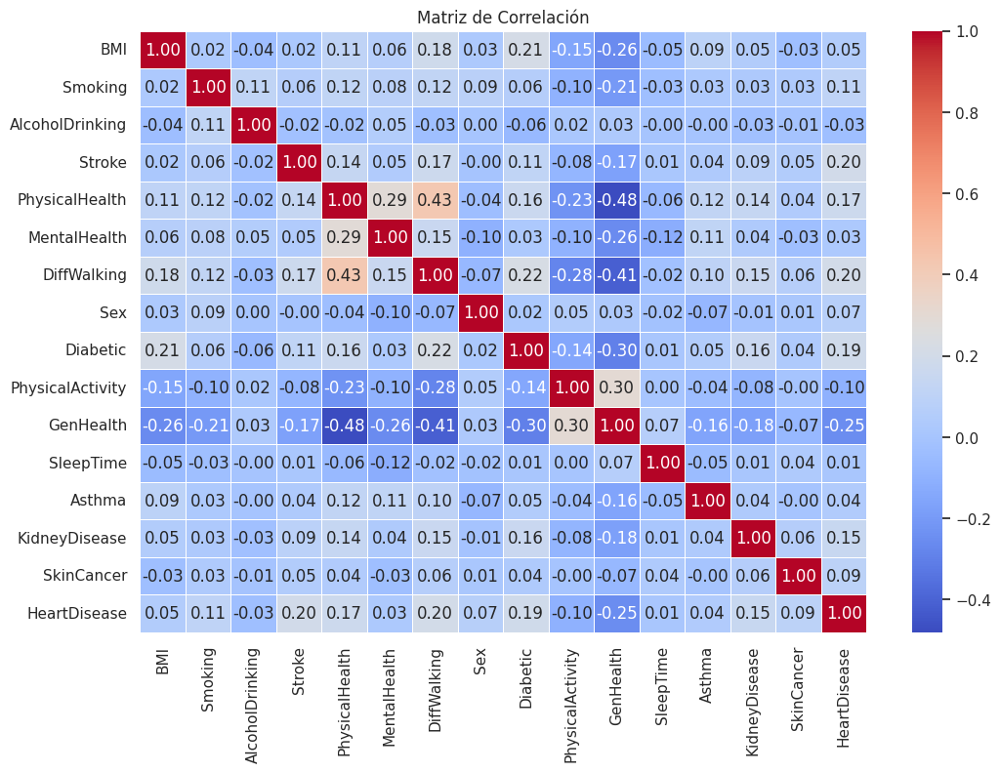

In [25]:
# Seleccionar solo las columnas numéricas
numeric_columns = data.select_dtypes(include=[float, int]).columns

# Calcular la matriz de correlación solo con las columnas numéricas
correlation_matrix = data[numeric_columns].corr()

# Mostrar la matriz de correlación
print("Matriz de correlación:")
print(correlation_matrix)

# Extraer las correlaciones de la columna 'Sex' con las demás variables
sex_correlation = correlation_matrix['Sex']

# Mostrar las correlaciones específicas
print("Correlación entre 'Sex' y otras variables:")
print(sex_correlation)

# Visualizar la matriz de correlación usando un gráfico de calor
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Matriz de Correlación')
plt.show()

In [28]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Identificar las columnas categóricas
categorical_columns = data.select_dtypes(include=['object']).columns

# Aplicar Label Encoding a las columnas categóricas restantes
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
for column in categorical_columns:
    data[column] = label_encoder.fit_transform(data[column])

# Seleccionar solo las columnas numéricas
numeric_columns = data.select_dtypes(include=[float, int]).columns

# Separar las variables independientes (features) y la variable dependiente (target)
X = data[numeric_columns].drop(columns=['Sex'])  # Features
y = data['Sex']  # Target

# Dividir el dataset en conjunto de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Crear y entrenar el modelo
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred = model.predict(X_test)

In [29]:
# Evaluar el modelo
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:")
print(classification_report(y_test, y_pred))

Accuracy: 0.6461128400613487
Classification Report:
              precision    recall  f1-score   support

           0       0.65      0.70      0.67     35331
           1       0.64      0.59      0.61     31826

    accuracy                           0.65     67157
   macro avg       0.65      0.64      0.64     67157
weighted avg       0.65      0.65      0.65     67157

